In [207]:
using CSV, DataFrames, Random, Gurobi, JuMP, Statistics, ScikitLearn, GLM, Statistics, Plots

## Loading data

In [208]:
# read in data
X_train_df = CSV.read("Preprocessed/X_train_scaled.csv", DataFrame)
X_test_df = CSV.read("Preprocessed/X_test_scaled.csv", DataFrame)
Y_train_df = CSV.read("Preprocessed/y_train.csv", DataFrame)
Y_test_df = CSV.read("Preprocessed/y_test.csv", DataFrame);

In [209]:
# Check the size of the data
size(X_train_df), size(X_test_df), size(Y_train_df), size(Y_test_df)

((8818, 19), (2205, 19), (8818, 3), (2205, 3))

In [210]:
X_train_df

Row,age,age_youngest_child,debt_equity,gender,bad_payment,gold_card,pension_plan,household_debt_to_equity_ratio,income,members_in_household,months_current_account,months_customer,call_center_contacts,loan_accounts,number_products,number_transactions,non_worker_percentage,white_collar_percentage,rfm_score
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,-0.209025,0.0882424,-0.209025,1.02178,-0.0543805,-0.177725,-0.0770195,-1.19193,-0.708545,0.398425,-1.1002,-1.0644,1.11758,0.65647,0.222585,0.00842164,0.0111827,1.23981,0.32641
2,0.656889,0.9698,0.656889,-0.97868,-0.0543805,-0.177725,-0.0770195,0.25933,-1.04821,-1.31149,-0.201499,-0.237377,-0.158208,2.11148,1.34866,0.00842164,0.274139,-0.458193,0.699145
3,0.13734,0.480046,0.13734,1.02178,-0.0543805,-0.177725,-0.0770195,-0.673623,0.251026,1.53837,-0.426175,-0.237377,0.479688,1.38397,0.785624,-0.208086,-0.51473,0.900211,0.780277
4,-0.641982,-0.891266,-0.641982,-0.97868,-0.0543805,-0.177725,-0.0770195,1.60693,0.36844,-1.31149,1.22145,1.41666,-1.434,-0.798538,-0.903493,-0.424593,-0.251774,-1.5902,-0.867649
5,-0.815165,-0.695364,-0.815165,1.02178,-0.0543805,-0.177725,-0.0770195,-0.777284,0.160493,-0.741521,-1.99891,-1.89142,0.479688,-0.798538,-0.903493,-0.424593,-0.51473,1.01341,-0.867649
6,-2.28722,-1.08717,-2.28722,-0.97868,-0.0543805,5.62666,-0.0770195,1.91791,-1.03938,0.398425,0.397638,0.589643,-1.434,1.38397,0.222585,-0.208086,-1.04064,-1.5902,0.17651
7,1.17644,1.26365,1.17644,1.02178,-0.0543805,-0.177725,-0.0770195,1.19228,-0.332109,-1.88147,1.37124,1.41666,-1.434,-0.798538,0.222585,0.00842164,1.85188,-2.1562,0.574807
8,1.08985,1.06775,1.08985,-0.97868,-0.0543805,-0.177725,-0.0770195,-2.12488,2.54603,-0.741521,-1.02531,-1.0644,2.39337,-0.798538,1.34866,0.224929,-0.777687,2.71142,1.04257
9,0.656889,0.675947,0.656889,1.02178,-0.0543805,-0.177725,-0.0770195,0.673975,-1.20019,-0.741521,-1.69934,-1.89142,-0.796104,-0.798538,-0.903493,-0.424593,1.06301,-1.1374,-0.867649


## EDA

In [211]:
train = hcat(X_train_df, Y_train_df);

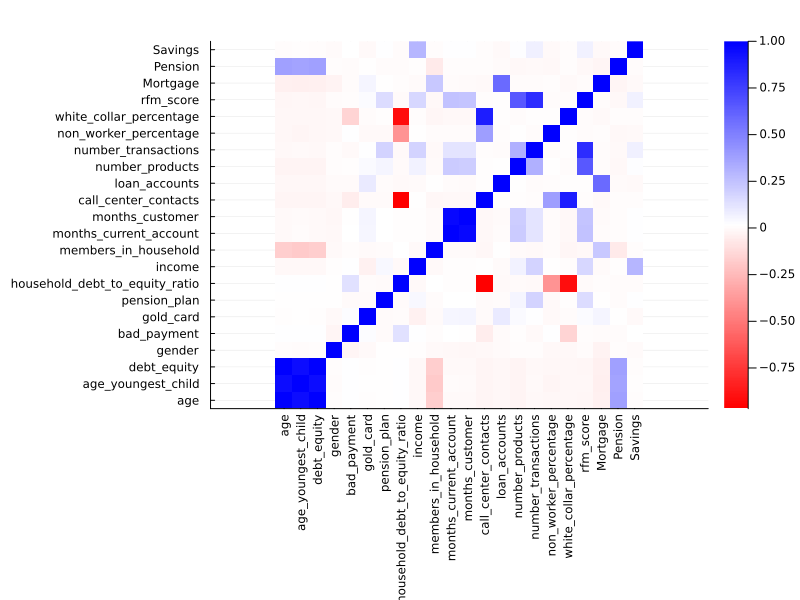

In [212]:
col_names = names(train)
corr_matrix = cor(Matrix(train))
custom_colors = cgrad([:red, :white, :blue])
heatmap(corr_matrix, color=custom_colors, aspect_ratio=:equal, 
        xticks=(1:length(col_names), col_names), 
        yticks=(1:length(col_names), col_names),
        xrotation=90, size=(800, 600))

For savings accounts, the highest correlated feature is income, with a correlation of around 0.2987. This makes sense as one would generally assume that people with higher income have more money to save and are therefore more likely to have saving accounts.

For pension accounts, the highest correlated features are age, age_youngest_child, and debt_equity, at correlation of approximately 0.3814. This is because the three features are have perfect positive correlation with each other. This is suprising since the dataset contains 8,818 different customers. Out of these three features, age seems the most relevant one because it is more general and easier to source.

For mortgage accounts, the highest correlated feature is loan_accounts, with a correlation of about 0.5916. Members_in_household also seems to describe a part of the Mortgage target variable. Even though the correlation is only around 0.2278, it might help to include it.

Overall, these four features seem the most important in explaining the three target varibles, whereas the other features do not seem to add much information. We therefore restrict the dataset to only contain the following features: age, income, members_in_household, and loan_accounts. 

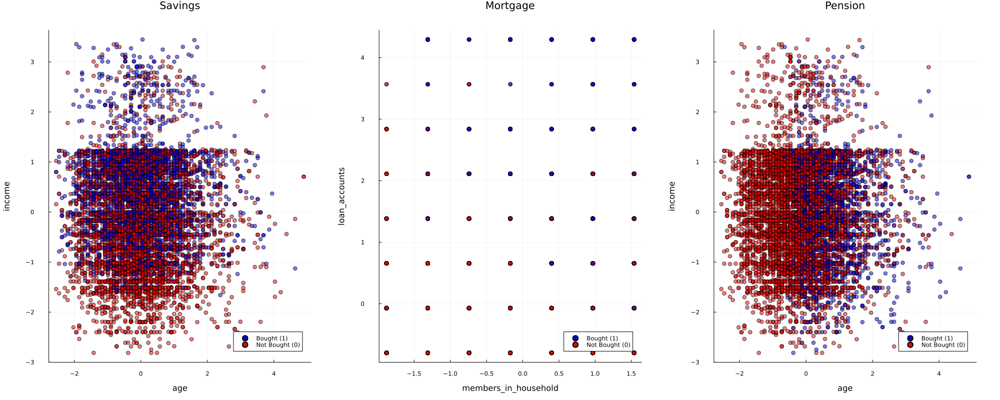

In [213]:
using Plots.PlotMeasures
# Define a function to plot the point clouds for the products
function plot_cloud_points(df)
    products = [:Savings, :Mortgage, :Pension] # Symbols for the column names
    plots = []
    
    # Loop over each product to create separate scatter plots
    for product in products
        x_column = product == :Mortgage ? :members_in_household : :age
        y_column = product == :Mortgage ? :loan_accounts : :income
        # Use broadcasting to apply the color mapping for each product value
        color_mapping = [value == 1 ? :blue : :red for value in df[!, product]]

        scatter_plot = scatter(df[!, x_column], df[!, y_column],
                               markeralpha=0.5,
                               markersize=4,
                               markercolor=color_mapping, # Apply the color mapping
                               label=nothing, # No label for actual data points
                               xlabel=String(x_column),
                               ylabel=String(y_column),
                               title=String(product))

        # Adding dummy points for the legend
        scatter!([NaN], [NaN], label="Bought (1)", markercolor=:blue, markersize=4)
        scatter!([NaN], [NaN], label="Not Bought (0)", markercolor=:red, markersize=4)

        push!(plots, scatter_plot)
    end
    
    # Combine individual plots into a single figure with specified layout, size, and margins
    combined_plot = plot(plots..., layout=(1, length(products)), size=(2000, 800), legend=:bottomright, 
                         margin=5mm) # Adjust the margin as needed

    # Optionally, modify the margin of each subplot if necessary
    for subplot in combined_plot.subplots
        subplot[:bottom_margin] = 10mm # Adjust bottom margin
        subplot[:left_margin] = 10mm  # Adjust left margin
        subplot[:right_margin] = 10mm  # Adjust right margin
        subplot[:top_margin] = 10mm    # Adjust top margin
    end
    
    combined_plot
end

# Call the function with your DataFrame 'train'
plot_cloud_points(train)


From the scatter plots, it becomes visible that the features that have been chosen are indeed important in understanding whether a not a product was bought by a customer. 

Customers with higher incomes tend to have savings accounts more than customers with lower income. For pension accounts, the focus lies on the age column. In the dataset, there are more older customers than younger customers that have pension accounts. Higher numbers of loan accounts and members in the household tend to jointly lead to higher likelihood of owning mortgage accounts. 

In [214]:
# feature engineering
X_train_df = X_train_df[!, [:age, :income, :members_in_household, :loan_accounts]]
X_test_df = X_test_df[!, [:age, :income, :members_in_household, :loan_accounts]]

Row,age,income,members_in_household,loan_accounts
,Float64,Float64,Float64,Float64
1,1.69599,0.703593,-0.171548,0.65647
2,-1.85426,-1.58603,-0.741521,-0.798538
3,0.916663,0.993816,1.53837,-0.798538
4,-1.94085,1.20186,1.53837,-0.798538
5,-0.815165,-0.718721,0.968399,-0.0710344
6,0.223932,0.364119,-0.741521,-0.798538
7,-0.382208,0.753708,-0.171548,0.65647
8,0.916663,1.22711,-0.741521,-0.798538
9,-0.988348,1.33473,-0.741521,-0.798538


In [215]:
# Define products
products = ["Savings", "Mortgage", "Pension"]

# Define unit value of each product
productValue = [200, 300, 400]
value_per_product = Dict(products[i] => productValue[i] for i in 1:length(products))

# Define total available budget
availableBudget = 25000 # /(11023/1000)

# For each channel, cost of making a marketing action and success factor
# Define the data
data = [("gift", 20.0, 0.20), 
        ("newsletter", 15.0, 0.05), 
        ("seminar", 23.0, 0.30)]

# Create a DataFrame
channels = DataFrame(channel = [x[1] for x in data],
                     cost = [x[2] for x in data],
                     success_prob = [x[3] for x in data]);

In [216]:
# get input data
I = size(X_train_df, 1)
J = size(products, 1)
K = size(channels, 1)
F = size(X_train_df, 2)
X_train = Matrix(X_train_df)
X_test = Matrix(X_test_df)
Y_train = Matrix(Y_train_df)
Y_test = Matrix(Y_test_df)
p = productValue
s = channels[!, :success_prob]
c = channels[!, :cost]
B = availableBudget;

# Predicting

### Random Forest

In [217]:
# Train Random Forest using IAI using the training set
grid_rf_1 = IAI.GridSearch(
    IAI.RandomForestClassifier(
        random_seed=123,
        max_categoric_levels_before_warning=15,
        criterion =:gini,
        num_trees = 100,
        cp = 0.001
        ),
        max_depth=1:6
    )        
IAI.fit_cv!(grid_rf_1,X_train, Y_train[:, 1], validation_criterion = :auc, n_folds=5);
lnr_rf_1 = IAI.get_learner(grid_rf_1)

Fitted RandomForestClassifier

In [218]:
# make predictions on the test set
Y_pred_rf_1 = IAI.predict(lnr_rf_1, X_test)
# compute the accuracy
accuracy_rf_1 = sum(Y_pred_rf_1 .== Y_test[:, 1]) / length(Y_test[:, 1])
# compute the AUC
auc_rf_1 = IAI.score(lnr_rf_1, X_test, Y_test[:, 1], criterion = :auc)

0.9401933985267301

In [219]:
# Train Random Forest using IAI using the training set
grid_rf_2 = IAI.GridSearch(
    IAI.RandomForestClassifier(
        random_seed=123,
        max_categoric_levels_before_warning=15,
        criterion =:gini,
        num_trees = 100,
        cp = 0.001
        ),
        max_depth=1:6
    )        
IAI.fit_cv!(grid_rf_2,X_train, Y_train[:, 2], validation_criterion = :auc, n_folds=5);
lnr_rf_2 = IAI.get_learner(grid_rf_2)

Fitted RandomForestClassifier

In [220]:
# make predictions on the test set
Y_pred_rf_2 = IAI.predict(lnr_rf_2, X_test)
# compute the accuracy
accuracy_rf_2 = sum(Y_pred_rf_2 .== Y_test[:, 2]) / length(Y_test[:, 2])
# compute the AUC
auc_rf_2 = IAI.score(lnr_rf_2, X_test, Y_test[:, 2], criterion = :auc)

0.7749811662432576

In [221]:
# Train Random Forest using IAI using the training set
grid_rf_3 = IAI.GridSearch(
    IAI.RandomForestClassifier(
        random_seed=123,
        max_categoric_levels_before_warning=15,
        criterion =:gini,
        num_trees = 100,
        cp = 0.001
        ),
        max_depth=1:6
    )        
IAI.fit_cv!(grid_rf_3,X_train, Y_train[:, 3], validation_criterion = :auc, n_folds=5);
lnr_rf_3 = IAI.get_learner(grid_rf_3)

Fitted RandomForestClassifier

In [222]:
# make predictions on the test set
Y_pred_rf_3 = IAI.predict(lnr_rf_3, X_test)
# compute the accuracy
accuracy_rf_3 = sum(Y_pred_rf_3 .== Y_test[:, 3]) / length(Y_test[:, 3])
# compute the AUC
auc_rf_3 = IAI.score(lnr_rf_3, X_test, Y_test[:, 3], criterion = :auc)

0.6873626689324467

In [223]:
# combine predictions
Y_pred_rf = hcat(Y_pred_rf_1, Y_pred_rf_2, Y_pred_rf_3)
sum(Y_pred_rf, dims=1)

1×3 Matrix{Int64}:
 335  10  71

In [224]:
# create a 200 * 3 matrix with random 0 or 1s
Random.seed!(123)
Y_pred_random = rand(0:1, 200, 3)
sum(Y_pred_random, dims=1)

1×3 Matrix{Int64}:
 106  110  116

In [225]:
sum(Matrix(Y_test_df),dims=1)

1×3 Matrix{Int64}:
 333  491  844

In [226]:
# transfer the prediction matrix to a dataframe
Y_pred_rf_df = DataFrame(Y_pred_rf, [:Savings, :Mortgage, :Pension]);

### Logistic Regression

In [227]:
# combine X_train and Y_train
XY_train_df = hcat(X_train_df, Y_train_df)

Row,age,income,members_in_household,loan_accounts,Mortgage,Pension,Savings
,Float64,Float64,Float64,Float64,Int64,Int64,Int64
1,-0.209025,-0.708545,0.398425,0.65647,0,0,0
2,0.656889,-1.04821,-1.31149,2.11148,1,0,0
3,0.13734,0.251026,1.53837,1.38397,0,0,0
4,-0.641982,0.36844,-1.31149,-0.798538,0,0,0
5,-0.815165,0.160493,-0.741521,-0.798538,0,0,0
6,-2.28722,-1.03938,0.398425,1.38397,1,0,1
7,1.17644,-0.332109,-1.88147,-0.798538,0,1,0
8,1.08985,2.54603,-0.741521,-0.798538,0,1,0
9,0.656889,-1.20019,-0.741521,-0.798538,0,0,1


In [228]:
loglrg_model_1 = glm(@formula(Mortgage ~ age + income + members_in_household + loan_accounts), XY_train_df, Binomial(), LogitLink())
loglrg_model_2 = glm(@formula(Pension ~ age + income + members_in_household + loan_accounts), XY_train_df, Binomial(), LogitLink())
loglrg_model_3 = glm(@formula(Savings ~ age + income + members_in_household + loan_accounts), XY_train_df, Binomial(), LogitLink())

Y_pred_lr_1 = GLM.predict(loglrg_model_1, X_test_df)
Y_pred_lr_2 = GLM.predict(loglrg_model_2, X_test_df)
Y_pred_lr_3 = GLM.predict(loglrg_model_3, X_test_df)

Y_pred_lr = hcat(Y_pred_lr_1, Y_pred_lr_2, Y_pred_lr_3)

Y_pred_lr = Y_pred_lr .> 0.5

# compute the accuracy
accuracy_lr_1 = sum(Y_pred_lr[:, 1] .== Y_test[:, 1]) / length(Y_test[:, 1])
accuracy_lr_2 = sum(Y_pred_lr[:, 2] .== Y_test[:, 2]) / length(Y_test[:, 2])
accuracy_lr_3 = sum(Y_pred_lr[:, 3] .== Y_test[:, 3]) / length(Y_test[:, 3])

0.6471655328798186

In [229]:
sum(Y_pred_lr, dims=1)

1×3 Matrix{Int64}:
 248  163  510

In [230]:
# change the type of Y_pred_lr to Int64
Y_pred_lr = map(Int64, Y_pred_lr)
# transfer the prediction matrix to a dataframe
Y_pred_lr_df = DataFrame(Y_pred_lr, [:Savings, :Mortgage, :Pension]);

### OCT

In [231]:
grid_oct_1 = IAI.GridSearch(
    IAI.OptimalTreeClassifier(
        random_seed=1,
    ),
    max_depth=1:10,
)
IAI.fit!(grid_oct_1, X_train, Y_train[:, 1])

Y_pred_oct_1 = IAI.predict(grid_oct_1, X_test)

oct_1_train_score = IAI.score(grid_oct_1, X_train, Y_train[:, 1], criterion=:auc)
oct_1_test_score = IAI.score(grid_oct_1, X_test, Y_test[:, 1], criterion=:auc)

0.8864633864633864

In [232]:
grid_oct_2 = IAI.GridSearch(
    IAI.OptimalTreeClassifier(
        random_seed=1,
    ),
    max_depth=1:10,
)
IAI.fit!(grid_oct_2, X_train, Y_train[:, 2])

Y_pred_oct_2 = IAI.predict(grid_oct_2, X_test)

oct_2_train_score = IAI.score(grid_oct_2, X_train, Y_train[:, 2], criterion=:auc)
oct_2_test_score = IAI.score(grid_oct_2, X_test, Y_test[:, 2], criterion=:auc)

0.5956838020185984

In [233]:
grid_oct_3 = IAI.GridSearch(
    IAI.OptimalTreeClassifier(
        random_seed=1,
    ),
    max_depth=1:10,
)
IAI.fit!(grid_oct_3, X_train, Y_train[:, 3])

Y_pred_oct_3 = IAI.predict(grid_oct_3, X_test)

oct_3_train_score = IAI.score(grid_oct_3, X_train, Y_train[:, 3], criterion=:auc)
oct_3_test_score = IAI.score(grid_oct_3, X_test, Y_test[:, 3], criterion=:auc)

0.5594780635927722

In [234]:
Y_pred_oct = hcat(Y_pred_oct_1, Y_pred_oct_2, Y_pred_oct_3)
sum(Y_pred_oct, dims=1)

1×3 Matrix{Int64}:
 319  131  358

In [235]:
Y_pred_oct_df = DataFrame(Y_pred_oct, [:Savings, :Mortgage, :Pension]);

### XGBoost

In [236]:
grid_xgb_1 = IAI.GridSearch(
    IAI.XGBoostClassifier(
        random_seed=1,
    ),
    max_depth=2:5,
    num_round=[20, 50, 100],
)
IAI.fit!(grid_xgb_1, X_train, Y_train[:, 1])

Y_pred_xgb_1 = IAI.predict(grid_xgb_1, X_test)

xgb_1_train_score = IAI.score(grid_xgb_1, X_train, Y_train[:, 1], criterion=:auc)
xgb_1_test_score = IAI.score(grid_xgb_1, X_test, Y_test[:, 1], criterion=:auc)

0.939595845845845

In [237]:
grid_xgb_2 = IAI.GridSearch(
    IAI.XGBoostClassifier(
        random_seed=1,
    ),
    max_depth=2:5,
    num_round=[20, 50, 100],
)
IAI.fit!(grid_xgb_2, X_train, Y_train[:, 2])

Y_pred_xgb_2 = IAI.predict(grid_xgb_2, X_test)

xgb_2_train_score = IAI.score(grid_xgb_2, X_train, Y_train[:, 2], criterion=:auc)
xgb_2_test_score = IAI.score(grid_xgb_2, X_test, Y_test[:, 2], criterion=:auc)

0.7788637719321178

In [238]:
grid_xgb_3 = IAI.GridSearch(
    IAI.XGBoostClassifier(
        random_seed=1,
    ),
    max_depth=2:5,
    num_round=[20, 50, 100],
)
IAI.fit!(grid_xgb_3, X_train, Y_train[:, 3])

Y_pred_xgb_3 = IAI.predict(grid_xgb_3, X_test)

xgb_3_train_score = IAI.score(grid_xgb_3, X_train, Y_train[:, 3], criterion=:auc)
xgb_3_test_score = IAI.score(grid_xgb_3, X_test, Y_test[:, 3], criterion=:auc)

0.6862727260064561

In [239]:
Y_pred_xgb = hcat(Y_pred_xgb_1, Y_pred_xgb_2, Y_pred_xgb_3)
sum(Y_pred_xgb, dims=1)

1×3 Matrix{Int64}:
 338  6  415

In [240]:
Y_pred_xgb_df = DataFrame(Y_pred_xgb, [:Savings, :Mortgage, :Pension]);

# Modeling

## Results Calculation Function

In [241]:
# Define a function to compute the results
function results_calculation(decision)
    # calculate core metirc
    revenue = sum((p[j] * s[k]) * Y_test[i, j] * decision[i, j, k] for i in 1:size(Y_test, 1) for j in 1:J for k in 1:K)
    budget = sum(c[k] * decision[i, j, k] for i in 1:size(Y_test, 1) for j in 1:J for k in 1:K)
    profit = - sum((c[k] - p[j] * s[k]) * Y_test[i, j] * decision[i, j, k] for i in 1:size(Y_test, 1) for j in 1:J for k in 1:K)
    customers = sum(decision)
    saving = sum(decision[:, 1, :])
    mortgage = sum(decision[:, 2, :])
    pension = sum(decision[:, 3, :])
    gift = sum(decision[:, :, 1])
    newsletter = sum(decision[:, :, 2])
    seminar = sum(decision[:, :, 3])
    return revenue, budget, profit, customers, saving, mortgage, pension, gift, newsletter, seminar
end

results_calculation (generic function with 1 method)

## Greedy Algorithm

In [242]:
function greedy_model(prediction_model)

    # choose the prediction model we want to use
    if prediction_model == "rf"
        offers = Y_pred_rf_df
    elseif prediction_model == "lr"
        offers = Y_pred_lr_df
    elseif prediction_model =="oct"
        offers = Y_pred_oct_df
    elseif prediction_model =="xgb"
        offers = Y_pred_xgb_df
    else
        println("Please choose a valid prediction model.")
    end


    # Set up the data
    gsol = zeros(Int64, length(offers[:, 1]), length(products), length(channels[:, 1]))
    budget = 0
    revenue = 0
    noffers = length(offers[:, 1])

    # Ensure the 10% per channel by choosing the most promising per channel
    for c in 1:length(channels[:, 1])
        i = 0
        while i < (noffers / 10)
            # Find a possible offer in this channel for a customer not yet done
            added = false
            for o in 1:noffers
                already = false
                for product in 1:length(products)
                    if sum(gsol[o, product, :]) == 1
                        already = true
                        break
                    end
                end
                if already
                    continue
                end
                
                possible = false
                possibleProduct = nothing
                
                for product in 1:length(products)
                    if offers[o, product] == 1
                        possible = true
                        possibleProduct = product
                        break
                    end
                end

                if !possible
                    continue
                end

                if budget >= B
                    break
                end
                
                gsol[o, possibleProduct, c] = 1
                i += 1
                added = true
                budget += channels[c, 2]

                revenue += channels[c, 3] * productValue[possibleProduct]
                break
            end
            
            if !added
                # println("NOT FEASIBLE")
                break
            end
        end
    end

    # return the solution
    return gsol
end


greedy_model (generic function with 1 method)

In [243]:
# Train the model using random forest as the prediction model
Z_greedy_rf = greedy_model("rf")
revenue_greedy_rf, budget_greedy_rf, profit_greedy_rf, customers_greedy_rf, savings_greedy_rf, mortgage_greedy_rf, pension_greedy_rf, gift_greedy_rf, newsletter_greedy_rf, seminar_greedy_rf  = results_calculation(Z_greedy_rf)

# Train the model using logistics regression as the prediction model
Z_greedy_lr = greedy_model("lr")
revenue_greedy_lr, budget_greedy_lr, profit_greedy_lr, customers_greedy_lr, savings_greedy_lr, mortgage_greedy_lr, pension_greedy_lr, gift_greedy_lr, newsletter_greedy_lr, seminar_greedy_lr  = results_calculation(Z_greedy_lr)

# Train the model using OCT as the prediction model
Z_greedy_oct = greedy_model("oct")
revenue_greedy_oct, budget_greedy_oct, profit_greedy_oct, customers_greedy_oct, savings_greedy_oct, mortgage_greedy_oct, pension_greedy_oct, gift_greedy_oct, newsletter_greedy_oct, seminar_greedy_oct  = results_calculation(Z_greedy_oct)

# Train the model using XGBoost as the prediction model
Z_greedy_xgb = greedy_model("xgb")
revenue_greedy_xgb, budget_greedy_xgb, profit_greedy_xgb, customers_greedy_xgb, savings_greedy_xgb, mortgage_greedy_xgb, pension_greedy_xgb, gift_greedy_xgb, newsletter_greedy_xgb, seminar_greedy_xgb  = results_calculation(Z_greedy_xgb)


# Create a dataframe to store the results
results_greedy = DataFrame(
    Method = ["Greedy", "Greedy", "Greedy", "Greedy"],
    Model = ["Random Forest", "Logistics Regression", "OCT", "XGBoost"],
    Revenue = [revenue_greedy_rf, revenue_greedy_lr, revenue_greedy_oct, revenue_greedy_xgb],
    Budget = [budget_greedy_rf, budget_greedy_lr, budget_greedy_oct, budget_greedy_xgb],
    Profit = [profit_greedy_rf, profit_greedy_lr, profit_greedy_oct, profit_greedy_xgb],
    Customers = [customers_greedy_rf, customers_greedy_lr, customers_greedy_oct, customers_greedy_xgb],
    Savings = [savings_greedy_rf, savings_greedy_lr, savings_greedy_oct, savings_greedy_xgb],
    Mortgage = [mortgage_greedy_rf, mortgage_greedy_lr, mortgage_greedy_oct, mortgage_greedy_xgb],
    Pension = [pension_greedy_rf, pension_greedy_lr, pension_greedy_oct, pension_greedy_xgb],
    Gift = [gift_greedy_rf, gift_greedy_lr, gift_greedy_oct, gift_greedy_xgb],
    Newsletter = [newsletter_greedy_rf, newsletter_greedy_lr, newsletter_greedy_oct, newsletter_greedy_xgb],
    Seminar = [seminar_greedy_rf, seminar_greedy_lr, seminar_greedy_oct, seminar_greedy_xgb]
)

Row,Method,Model,Revenue,Budget,Profit,Customers,Savings,Mortgage,Pension,Gift,Newsletter,Seminar
,String,String,Float64,Float64,Float64,Int64,Int64,Int64,Int64,Int64,Int64,Int64
1,Greedy,Random Forest,7525.0,7075.0,3025.0,398,335,10,53,221,177,0
2,Greedy,Logistics Regression,22660.0,12818.0,15026.0,663,206,112,345,221,221,221
3,Greedy,OCT,21595.0,12818.0,13952.0,663,289,100,274,221,221,221
4,Greedy,XGBoost,20820.0,12818.0,13291.0,663,320,6,337,221,221,221


## Sample Average Approximation

In [244]:
# define model
function saa_model(I, J, K, F, X, Y, p, s, c, B)
    # define model
    model = Model(Gurobi.Optimizer)
    set_time_limit_sec(model, 30)

    # define variables
    @variable(model, Z[1:I, 1:J, 1:K], Bin)

    # define the constraints
    @constraint(model, sum(c[k] * sum(Z[i, j, k] for i in 1:I for j in 1:J) for k in 1:K) <= B)
    # @constraint(model, [k=1:K], sum(Z[i, j, k] for i in 1:I for j in 1:J) >= 0.1 * I)
    @constraint(model, [i=1:I, k=1:K], sum(Z[i, j, k] for j in 1:J) <= 1)
    @constraint(model, [i=1:I, j=1:J], sum(Z[i, j, k] for k in 1:K) <= 1)
    for i_1 in 1:I
        for i_2 in 1:I
            @constraint(model, [j=1:J, k=1:K], Z[i_1, j, k] == Z[i_2, j, k])
        end
    end

    # define the objective function
    @objective(model, Min, 1 / I * sum((c[k] - p[j] * s[k]) * Y[i, j] * Z[i, j, k] for i in 1:I for j in 1:J for k in 1:K))

    # solve the model
    optimize!(model)

    # return the decision variables
    return value.(Z)
end

saa_model (generic function with 1 method)

In [245]:
# # build model
# Z_saa = saa_model(I, J, K, F, X_train, Y_train, p, s, c, B);
# # calculate results
# revenue_saa, budget_saa, profit_saa, customers_saa, savings_saa, mortgage_saa, pension_saa, gift_saa, newsletter_saa, seminar_saa  = results_calculation(Z_saa)
# # create a dataframe to store the results
# results_saa = DataFrame(
#     Method = ["Sample Average Approximation"],
#     Model = ["Average"],
#     Revenue = [revenue_saa],
#     Budget = [budget_saa],
#     Profit = [profit_saa],
#     Customers = [customers_saa],
#     Savings = [savings_saa],
#     Mortgage = [mortgage_saa],
#     Pension = [pension_saa],
#     Gift = [gift_saa],
#     Newsletter = [newsletter_saa],
#     Seminar = [seminar_saa]
# )

# SAA is infeasible, so assign 0 to all the results
results_saa = DataFrame(
    Method = ["SAA"],
    Model = ["Sample Average"],
    Revenue = [0],
    Budget = [0],
    Profit = [0],
    Customers = [0],
    Savings = [0],
    Mortgage = [0],
    Pension = [0],
    Gift = [0],
    Newsletter = [0],
    Seminar = [0]
)

Row,Method,Model,Revenue,Budget,Profit,Customers,Savings,Mortgage,Pension,Gift,Newsletter,Seminar
,String,String,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64
1,SAA,Sample Average,0,0,0,0,0,0,0,0,0,0


## Point Prediction

In [246]:
# buil model for point prediction
function pp_model(J, K, X, Y, p, s, c, B)
    # get number of customers
    I = size(X, 1)

    # define model
    model = Model(Gurobi.Optimizer)

    # define variables
    @variable(model, Z[1:I, 1:J, 1:K], Bin)

    # define the constraints
    @constraint(model, sum(c[k] * sum(Z[i, j, k] for i in 1:I for j in 1:J) for k in 1:K) <= B)
    @constraint(model, [k=1:K], sum(Z[i, j, k] for i in 1:I for j in 1:J) >= 0.1 * I)
    @constraint(model, [i=1:I, k=1:K], sum(Z[i, j, k] for j in 1:J) <= 1)
    @constraint(model, [i=1:I, j=1:J], sum(Z[i, j, k] for k in 1:K) <= 1)

    # define the objective function
    @objective(model, Min, sum((c[k] - p[j] * s[k]) * Y[i, j] * Z[i, j, k] for i in 1:I for j in 1:J for k in 1:K))

    # solve the model
    optimize!(model)

    # return the results
    return value.(Z), objective_value(model)
end

pp_model (generic function with 1 method)

In [247]:
# build model for random forest
Z_pp_rf, objective_pp_rf = pp_model(J, K, X_test, Y_pred_rf, p, s, c, B);
# calculate results
revenue_pp_rf, budget_pp_rf, profit_pp_rf, customers_pp_rf, savings_pp_rf, mortgage_pp_rf, pension_pp_rf, gift_pp_rf, newsletter_pp_rf, seminar_pp_rf  = results_calculation(Z_pp_rf)
# create a dataframe to store the results
results_pp_rf = DataFrame(
    Method = ["Point Prediction"],
    Model = ["Random Forest"],
    Revenue = [revenue_pp_rf],
    Budget = [budget_pp_rf],
    Profit = [profit_pp_rf],
    Customers = [customers_pp_rf],
    Savings = [savings_pp_rf],
    Mortgage = [mortgage_pp_rf],
    Pension = [pension_pp_rf],
    Gift = [gift_pp_rf],
    Newsletter = [newsletter_pp_rf],
    Seminar = [seminar_pp_rf]
)

Set parameter Username
Academic license - for non-commercial use only - expires 2024-10-25
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (mac64[arm])

CPU model: Apple M1 Pro
Thread count: 10 physical cores, 10 logical processors, using up to 10 threads

Optimize a model with 13234 rows, 19845 columns and 79380 nonzeros
Model fingerprint: 0x8ca4770a
Variable types: 0 continuous, 19845 integer (19845 binary)
Coefficient statistics:
  Matrix range     [1e+00, 2e+01]
  Objective range  [5e+00, 1e+02]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 2e+04]
Found heuristic solution: objective -10730.00000
Presolve time: 0.04s
Presolved: 13234 rows, 19845 columns, 79380 nonzeros
Variable types: 0 continuous, 19845 integer (19845 binary)
Found heuristic solution: objective -18053.00000

Root relaxation: objective -1.964600e+04, 288 iterations, 0.03 seconds (0.04 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntI

Row,Method,Model,Revenue,Budget,Profit,Customers,Savings,Mortgage,Pension,Gift,Newsletter,Seminar
,String,String,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,Point Prediction,Random Forest,23670.0,16889.0,15608.0,840.0,436.0,121.0,283.0,221.0,221.0,398.0


In [248]:
# build model for logistics regression
Z_pp_lr, objective_pp_lr = pp_model(J, K, X_test, Y_pred_lr, p, s, c, B);
# calculate results
revenue_pp_lr, budget_pp_lr, profit_pp_lr, customers_pp_lr, savings_pp_lr, mortgage_pp_lr, pension_pp_lr, gift_pp_lr, newsletter_pp_lr, seminar_pp_lr  = results_calculation(Z_pp_lr)
# create a dataframe to store the results
results_pp_lr = DataFrame(
    Method = ["Point Prediction"],
    Model = ["Logistics Regression"],
    Revenue = [revenue_pp_lr],
    Budget = [budget_pp_lr],
    Profit = [profit_pp_lr],
    Customers = [customers_pp_lr],
    Savings = [savings_pp_lr],
    Mortgage = [mortgage_pp_lr],
    Pension = [pension_pp_lr],
    Gift = [gift_pp_lr],
    Newsletter = [newsletter_pp_lr],
    Seminar = [seminar_pp_lr]
)

Set parameter Username
Academic license - for non-commercial use only - expires 2024-10-25
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (mac64[arm])

CPU model: Apple M1 Pro
Thread count: 10 physical cores, 10 logical processors, using up to 10 threads

Optimize a model with 13234 rows, 19845 columns and 79380 nonzeros
Model fingerprint: 0x54fcd253
Variable types: 0 continuous, 19845 integer (19845 binary)
Coefficient statistics:
  Matrix range     [1e+00, 2e+01]
  Objective range  [5e+00, 1e+02]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 2e+04]
Found heuristic solution: objective -29413.00000
Presolve time: 0.04s
Presolved: 13234 rows, 19845 columns, 79380 nonzeros
Variable types: 0 continuous, 19845 integer (19845 binary)
Found heuristic solution: objective -46067.00000

Root relaxation: objective -6.621109e+04, 1543 iterations, 0.03 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth Int

Row,Method,Model,Revenue,Budget,Profit,Customers,Savings,Mortgage,Pension,Gift,Newsletter,Seminar
,String,String,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,Point Prediction,Logistics Regression,52130.0,24985.0,38752.0,1192.0,308.0,219.0,665.0,221.0,221.0,750.0


In [249]:
# build model for logistics regression
Z_pp_oct, objective_pp_oct = pp_model(J, K, X_test, Y_pred_oct, p, s, c, B);
# calculate results
revenue_pp_oct, budget_pp_oct, profit_pp_oct, customers_pp_oct, savings_pp_oct, mortgage_pp_oct, pension_pp_oct, gift_pp_oct, newsletter_pp_oct, seminar_pp_oct  = results_calculation(Z_pp_oct)
# create a dataframe to store the results
results_pp_oct = DataFrame(
    Method = ["Point Prediction"],
    Model = ["OCT"],
    Revenue = [revenue_pp_oct],
    Budget = [budget_pp_oct],
    Profit = [profit_pp_oct],
    Customers = [customers_pp_oct],
    Savings = [savings_pp_oct],
    Mortgage = [mortgage_pp_oct],
    Pension = [pension_pp_oct],
    Gift = [gift_pp_oct],
    Newsletter = [newsletter_pp_oct],
    Seminar = [seminar_pp_oct]
)

Set parameter Username
Academic license - for non-commercial use only - expires 2024-10-25
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (mac64[arm])

CPU model: Apple M1 Pro
Thread count: 10 physical cores, 10 logical processors, using up to 10 threads

Optimize a model with 13234 rows, 19845 columns and 79380 nonzeros
Model fingerprint: 0xbbf03a91
Variable types: 0 continuous, 19845 integer (19845 binary)
Coefficient statistics:
  Matrix range     [1e+00, 2e+01]
  Objective range  [5e+00, 1e+02]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 2e+04]
Found heuristic solution: objective -27079.00000
Presolve time: 0.04s
Presolved: 13234 rows, 19845 columns, 79380 nonzeros
Variable types: 0 continuous, 19845 integer (19845 binary)
Found heuristic solution: objective -41248.00000

Root relaxation: objective -5.401200e+04, 1287 iterations, 0.05 seconds (0.10 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth Int

Row,Method,Model,Revenue,Budget,Profit,Customers,Savings,Mortgage,Pension,Gift,Newsletter,Seminar
,String,String,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,Point Prediction,OCT,45200.0,24985.0,32836.0,1192.0,451.0,210.0,531.0,221.0,221.0,750.0


In [250]:
# build model for logistics regression
Z_pp_xgb, objective_pp_xgb = pp_model(J, K, X_test, Y_pred_xgb, p, s, c, B);
# calculate results
revenue_pp_xgb, budget_pp_xgb, profit_pp_xgb, customers_pp_xgb, savings_pp_xgb, mortgage_pp_xgb, pension_pp_xgb, gift_pp_xgb, newsletter_pp_xgb, seminar_pp_xgb  = results_calculation(Z_pp_xgb)
# create a dataframe to store the results
results_pp_xgb = DataFrame(
    Method = ["Point Prediction"],
    Model = ["XGBoost"],
    Revenue = [revenue_pp_xgb],
    Budget = [budget_pp_xgb],
    Profit = [profit_pp_xgb],
    Customers = [customers_pp_xgb],
    Savings = [savings_pp_xgb],
    Mortgage = [mortgage_pp_xgb],
    Pension = [pension_pp_xgb],
    Gift = [gift_pp_xgb],
    Newsletter = [newsletter_pp_xgb],
    Seminar = [seminar_pp_xgb]
)

Set parameter Username
Academic license - for non-commercial use only - expires 2024-10-25
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (mac64[arm])

CPU model: Apple M1 Pro
Thread count: 10 physical cores, 10 logical processors, using up to 10 threads

Optimize a model with 13234 rows, 19845 columns and 79380 nonzeros
Model fingerprint: 0x7b35a0b4
Variable types: 0 continuous, 19845 integer (19845 binary)
Coefficient statistics:
  Matrix range     [1e+00, 2e+01]
  Objective range  [5e+00, 1e+02]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 2e+04]
Found heuristic solution: objective -27209.00000
Presolve time: 0.04s
Presolved: 13234 rows, 19845 columns, 79380 nonzeros
Variable types: 0 continuous, 19845 integer (19845 binary)
Found heuristic solution: objective -48499.00000

Root relaxation: objective -5.212600e+04, 1081 iterations, 0.04 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth Int

Row,Method,Model,Revenue,Budget,Profit,Customers,Savings,Mortgage,Pension,Gift,Newsletter,Seminar
,String,String,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,Point Prediction,XGBoost,43095.0,24295.0,31374.0,1162.0,501.0,78.0,583.0,221.0,221.0,720.0


## Predictive Prescription

In [251]:
@sk_import neighbors: KNeighborsClassifier

PyObject <class 'sklearn.neighbors._classification.KNeighborsClassifier'>

In [252]:
knn_models = []
X_train = Matrix(X_train)
for k in 1:2:15
    knn = KNeighborsClassifier(k)
    ScikitLearn.fit!(knn, X_train, Y_train)
    push!(knn_models, knn)
end

In [253]:
# create the model
function knn_model(lnr, N, J, K, X, Y, p, s, c, B)
    # X is the test set
    # Y is the train set
    # N is the number of neighbors

    # get neighbors
    Y_neighbors = lnr.kneighbors(X, return_distance=false) 

    # get number of customers
    I = size(X, 1)

    # define model
    model = Model(Gurobi.Optimizer)

    # define variables
    @variable(model, Z[1:I, 1:J, 1:K], Bin)

    # define the constraints
    @constraint(model, sum(c[k] * sum(Z[i, j, k] for i in 1:I for j in 1:J) for k in 1:K) <= B)
    @constraint(model, [k=1:K], sum(Z[i, j, k] for i in 1:I for j in 1:J) >= 0.1 * I)
    @constraint(model, [i=1:I, k=1:K], sum(Z[i, j, k] for j in 1:J) <= 1)
    @constraint(model, [i=1:I, j=1:J], sum(Z[i, j, k] for k in 1:K) <= 1)

    # define the objective function
    @objective(model, Min, sum((c[k] - p[j] * s[k]) * sum(Y[Y_neighbors[i, n] + 1, j] for n in 1:N) / N * Z[i, j, k] for i in 1:I for j in 1:J for k in 1:K))

    # solve the model
    optimize!(model)

    # return the results
    return value.(Z), objective_value(model)
end

knn_model (generic function with 1 method)

In [254]:
# build model
Z_pres_knn, objective_pres_knn = knn_model(knn_models[8], 15, J, K, X_test, Y_train, p, s, c, B);
# calculate results
revenue_pres_knn, budget_pres_knn, profit_pres_knn, customers_pres_knn, savings_pres_knn, mortgage_pres_knn, pension_pres_knn, gift_pres_knn, newsletter_pres_knn, seminar_pres_knn  = results_calculation(Z_pres_knn)
# create a dataframe to store the results
results_pres_knn = DataFrame(
    Method = ["Prescriptive"],
    Model = ["KNN"],
    Revenue = [revenue_pres_knn],
    Budget = [budget_pres_knn],
    Profit = [profit_pres_knn],
    Customers = [customers_pres_knn],
    Savings = [savings_pres_knn],
    Mortgage = [mortgage_pres_knn],
    Pension = [pension_pres_knn],
    Gift = [gift_pres_knn],
    Newsletter = [newsletter_pres_knn],
    Seminar = [seminar_pres_knn]
)

Set parameter Username
Academic license - for non-commercial use only - expires 2024-10-25
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (mac64[arm])

CPU model: Apple M1 Pro
Thread count: 10 physical cores, 10 logical processors, using up to 10 threads

Optimize a model with 13234 rows, 19845 columns and 79380 nonzeros
Model fingerprint: 0xd890aa7d
Variable types: 0 continuous, 19845 integer (19845 binary)
Coefficient statistics:
  Matrix range     [1e+00, 2e+01]
  Objective range  [3e-01, 9e+01]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 2e+04]
Found heuristic solution: objective -12375.80000
Presolve time: 0.04s
Presolved: 13234 rows, 19845 columns, 79380 nonzeros
Variable types: 0 continuous, 19845 integer (19845 binary)
Found heuristic solution: objective -14719.80000

Root relaxation: objective -4.812825e+04, 1536 iterations, 0.03 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth Int

Row,Method,Model,Revenue,Budget,Profit,Customers,Savings,Mortgage,Pension,Gift,Newsletter,Seminar
,String,String,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,Prescriptive,KNN,52840.0,25000.0,40946.0,1193.0,0.0,65.0,1128.0,221.0,222.0,750.0


## Kernel Methods

In [255]:
function kernels(train, test, y, g, bandwidth)
    num = zeros(3,1)
    den = 0
    for i=1:size(train,1)
        x = (train[i, :] -  test[g, :]) / bandwidth
        norm = Int(sqrt(x' * x) <= 1)
        num += y[i, :] * norm
        den += norm
    end
    y_pred = num/den
    return y_pred
end

function create_kernel_matrix(train, test, y, bandwidth, J)
    m = zeros(size(test, 1), J)
    for g=1:size(test, 1)
        m[g,:] = kernels(train, test, y, g, bandwidth)
    end
    m[isnan.(m)] .= 0.
    return m
end

create_kernel_matrix (generic function with 1 method)

In [256]:
# create the model
function kernel_methods_model(J, K, X, Y, p, s, c, B, X_train, bandwidth)
    # X is the test set
    # Y is the train set
    # N is the number of neighbors

    #get kernel predictions (takes some time)
    y_kernel =  create_kernel_matrix(X_train, X, Y, bandwidth, J) 

    # get number of customers
    I = size(X, 1)

    # define model
    model = Model(Gurobi.Optimizer)

    # define variables
    @variable(model, Z[1:I, 1:J, 1:K], Bin)

    # define the constraints
    @constraint(model, sum(c[k] * sum(Z[i, j, k] for i in 1:I for j in 1:J) for k in 1:K) <= B)
    @constraint(model, [k=1:K], sum(Z[i, j, k] for i in 1:I for j in 1:J) >= 0.1 * I)
    @constraint(model, [i=1:I, k=1:K], sum(Z[i, j, k] for j in 1:J) <= 1)
    @constraint(model, [i=1:I, j=1:J], sum(Z[i, j, k] for k in 1:K) <= 1)

    # define the objective function
    @objective(model, Min, sum((c[k] - p[j] *s[k]) * y_kernel[i, j] * Z[i, j, k] for i=1:I for j=1:J for k=1:K))

    # solve the model
    optimize!(model)

    # return the results
    return value.(Z), objective_value(model)
end

kernel_methods_model (generic function with 1 method)

In [257]:
# build model
Z_pres_km, objective_pres_km = kernel_methods_model(J, K, X_test, Y_train, p, s, c, B, X_train, 1.5);
# calculate results
revenue_pres_km, budget_pres_km, profit_pres_km, customers_pres_km, savings_pres_km, mortgage_pres_km, pension_pres_km, gift_pres_km, newsletter_pres_km, seminar_pres_km  = results_calculation(Z_pres_km)
# create a dataframe to store the results
results_pres_km = DataFrame(
    Method = ["Prescriptive"],
    Model = ["Kernel Method"],
    Revenue = [revenue_pres_km],
    Budget = [budget_pres_km],
    Profit = [profit_pres_km],
    Customers = [customers_pres_km],
    Savings = [savings_pres_km],
    Mortgage = [mortgage_pres_km],
    Pension = [pension_pres_km],
    Gift = [gift_pres_km],
    Newsletter = [newsletter_pres_km],
    Seminar = [seminar_pres_km]
)

Set parameter Username
Academic license - for non-commercial use only - expires 2024-10-25
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (mac64[arm])

CPU model: Apple M1 Pro
Thread count: 10 physical cores, 10 logical processors, using up to 10 threads

Optimize a model with 13234 rows, 19845 columns and 79380 nonzeros
Model fingerprint: 0xa21842b1
Variable types: 0 continuous, 19845 integer (19845 binary)
Coefficient statistics:
  Matrix range     [1e+00, 2e+01]
  Objective range  [2e-03, 7e+01]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 2e+04]
Found heuristic solution: objective -9356.943462
Presolve time: 0.04s
Presolved: 13234 rows, 19845 columns, 79380 nonzeros
Variable types: 0 continuous, 19845 integer (19845 binary)
Found heuristic solution: objective -9859.447171

Root relaxation: objective -4.229577e+04, 1339 iterations, 0.01 seconds (0.02 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth Int

Row,Method,Model,Revenue,Budget,Profit,Customers,Savings,Mortgage,Pension,Gift,Newsletter,Seminar
,String,String,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,Prescriptive,Kernel Method,59090.0,25000.0,46327.0,1193.0,0.0,2.0,1191.0,221.0,222.0,750.0


# Final Score Comparison

In [258]:
# combine all the results
results = vcat(results_greedy, results_saa, results_pp_rf, results_pp_lr, results_pp_oct, results_pp_xgb, results_pres_knn, results_pres_km)

Row,Method,Model,Revenue,Budget,Profit,Customers,Savings,Mortgage,Pension,Gift,Newsletter,Seminar
,String,String,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,Greedy,Random Forest,7525.0,7075.0,3025.0,398.0,335.0,10.0,53.0,221.0,177.0,0.0
2,Greedy,Logistics Regression,22660.0,12818.0,15026.0,663.0,206.0,112.0,345.0,221.0,221.0,221.0
3,Greedy,OCT,21595.0,12818.0,13952.0,663.0,289.0,100.0,274.0,221.0,221.0,221.0
4,Greedy,XGBoost,20820.0,12818.0,13291.0,663.0,320.0,6.0,337.0,221.0,221.0,221.0
5,SAA,Sample Average,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,Point Prediction,Random Forest,23670.0,16889.0,15608.0,840.0,436.0,121.0,283.0,221.0,221.0,398.0
7,Point Prediction,Logistics Regression,52130.0,24985.0,38752.0,1192.0,308.0,219.0,665.0,221.0,221.0,750.0
8,Point Prediction,OCT,45200.0,24985.0,32836.0,1192.0,451.0,210.0,531.0,221.0,221.0,750.0
9,Point Prediction,XGBoost,43095.0,24295.0,31374.0,1162.0,501.0,78.0,583.0,221.0,221.0,720.0


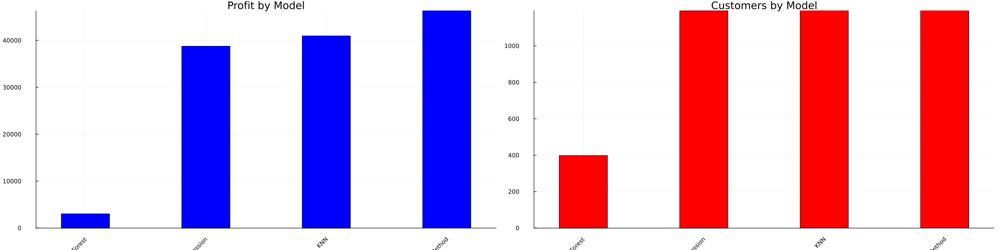

In [277]:
# Creating a DataFrame
data = DataFrame(
    Models = ["Random Forest", "Logistics Regression", "KNN", "Kernel Method"],
    Profit = [3025, 38752, 40946, 46327],  # Actual profit values
    Customers = [398, 1192, 1193, 1193]    # Actual customer counts
)

# Function to create a bar plot for the given y-values
function create_bar_plot(y_values, title; color, yticks=:auto, ylims=:auto)
    bar(data.Models, y_values, bar_width=0.4, color=color,
        xrotation=45, legend=false, size=(1000, 500),
        ylims=ylims, yticks=yticks)
    plot!(title=title, yformatter=:plain)  # Use plain formatting for y-axis
end

# Creating two bar plots: one for Profit and one for Customers
p1 = create_bar_plot(data.Profit, "Profit by Model", color=:blue, yticks=0:10000:50000)
p2 = create_bar_plot(data.Customers, "Customers by Model", color=:red, yticks=0:200:1200)

# Combine the plots into a single figure
combined_plot = plot(p1, p2, layout=(1,2), size=(2000, 500))